Problem Statement: If we want to analyze that the city bike share system is optimaly covering the needs of working class people, we have to see the relationship between the docks distribution over neighbourhoods and the number of enterprises.
Using the points data provided containing information of enterprises, we will show the number of employees and enterprises in each neighbourhood of Tartu that will help in visual analysis of the distribution of current docking stations network. 

PART 1 : Creating Static Maps

In [1]:
#importing libraries
from shapely.geometry import Point, LineString, Polygon
from shapely.geometry import MultiPoint, MultiLineString, MultiPolygon, box
import pandas as pd
import pyproj
import math
from pyproj import Geod
import pandas as pd
import numpy as np 
import geopandas as gpd
from fiona.crs import from_epsg
from shapely.geometry import Point,LineString,Polygon
import matplotlib.pyplot as plt
from shapely.ops import cascaded_union
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import geoplot
from matplotlib_scalebar.scalebar import ScaleBar

In [2]:
#creating file handles and reading all the relevant data

#reading the vector data
fh1 = "Docks.shp"
fh2 = "Enterprises.shp"
fh3 = "roads.shp"
fh4 = "Cadastre.shp"
fh5 = "Tartu.shp"

docks = gpd.read_file(fh1)
enterprises = gpd.read_file(fh2)
roads = gpd.read_file(fh3)
cadastre = gpd.read_file(fh4)
tartu = gpd.read_file(fh5)
# print(docks.crs)
# print(enterprises.crs)
# print(roads.crs)
# print(cadastre.crs)
#print(tartu.crs)

In [3]:
#analyzing how many enterprises are within each neighbourhood & count the number of employees in each neighbourhood

#creating a temporary dataframe to make spatial join of enterprises and tartu neighbourhoods
temp_sj = gpd.sjoin(enterprises,tartu,op='within')

#grouping the data by neighbourhood names
temp_grouped = temp_sj.groupby('ASUM').agg({'FID_':'count', 'Number_Emp': 'sum'})

#renaming columns to make it look nicer
temp_grouped = temp_grouped.rename(columns={'ASUM': 'ASUM', 'FID_': 'no_of_enterprises', 'Number_Emp':'no_of_employees'})

#making a final gdf to keep the number of enterprises and sum of employees for each neighbourhood
tartu_ee=tartu.merge(temp_grouped, on='ASUM', how='outer') #final Polygon gdf which will be used for mapping


#finding those enterprises which are registered within residential lands cadastre
enterprises_sj = gpd.sjoin(enterprises,cadastre,op='within')

enterprise_error= (enterprises_sj.loc[enterprises_sj['type'] == 'residential land'])
enterprise_noerror= (enterprises_sj.loc[enterprises_sj['type'] != 'residential land'])

#a glimpse of fields we made
tartu_ee.head()

,NR,LINNAOSA,ASUMI_NR,ASUM,Shape_Leng,Shape_Area,geometry,no_of_enterprises,no_of_employees
0,7,Kesklinn,72,Toometaguse,2976.534380,273210.976227,"POLYGON ((658447.072 6474157.279, 658497.881 6...",75,367
1,6,Vaksali,62,Kastani-Filosoofi,2968.133902,315323.674618,"POLYGON ((658675.467 6473133.471, 658820.614 6...",151,980
2,6,Vaksali,61,Vaksali,2825.605137,450123.191514,"POLYGON ((657944.767 6473898.431, 658135.097 6...",176,913
3,7,Kesklinn,74,Uus Kesklinn,2893.612349,462804.551849,"POLYGON ((659277.074 6474119.048, 659233.712 6...",261,3846
4,7,Kesklinn,71,Vanalinn,2962.949736,495690.394705,"POLYGON ((658752.096 6474547.207, 658824.421 6...",312,8213


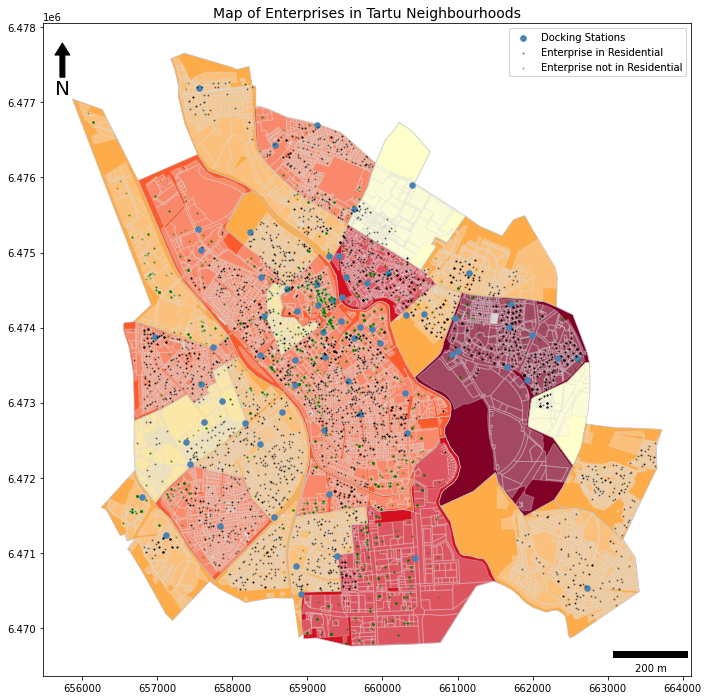

In [4]:
#Map of enterprises in tartu and also highlighting those enterprises which are registered in residential cadastre
fig, ax = plt.subplots(figsize=(22, 12))
tartu_ee.plot(ax=ax,column="no_of_enterprises",cmap='YlOrRd',edgecolor='silver', scheme='Percentiles', lw=0.7,legend=True )
cadastre.plot(ax=ax, facecolor='whitesmoke',edgecolor='gainsboro', alpha=0.3)
#roads.plot(ax=ax, color="black", linewidth=1)
docks.plot(ax=ax, color="steelblue", markersize=30, legend=True, label= "Docking Stations")

enterprise_error.plot(ax=ax, color='black',markersize=1, alpha=0.4, legend=True, label= "Enterprise in Residential" )
enterprise_noerror.plot(ax=ax, color='green',markersize=1, alpha=0.4, legend=True, label= "Enterprise not in Residential" )


#WAS NOT ABLE TO ADD ALL LEGENDS AT THE SAME TIME so i created two different maps 1-2 & 1.....
legend2= plt.legend()
plt.gca().add_artist(legend2)


#adding north arrow
x, y, arrow_length = 0.03, 0.97, 0.07
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)


#adding the scale bar
scalebar = ScaleBar(0.2)# 1 pixel = 0.2 meter
scalebar.location = 'lower right'
plt.gca().add_artist(scalebar)
plt.title("Map of Enterprises in Tartu Neighbourhoods", y=1, fontsize=14)


#labels
# for x, y, label in zip(docks.geometry.x, docks.geometry.y, docks.DockNames):
#     ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")


#saving to file
plt.savefig('StaticMap1.png',dpi=300,bbox_inches='tight')


C:\Users\humza\.conda\envs\geopy2020\lib\site-packages\ipykernel_launcher.py:20: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.


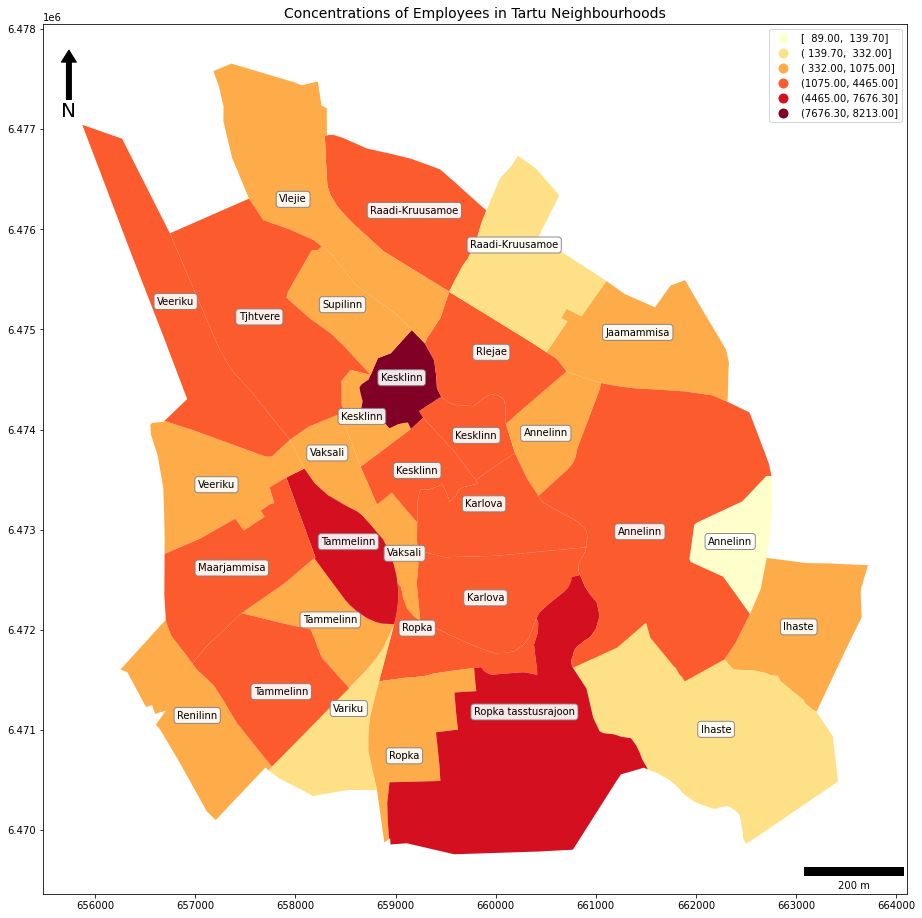

In [5]:
#Map of employees in tartu
fig, ax = plt.subplots(figsize=(22, 16))
tartu_ee.plot(ax=ax,column="no_of_employees",cmap='YlOrRd',scheme='Percentiles', lw=0.7,legend=True)

x, y, arrow_length = 0.03, 0.97, 0.07
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
scalebar = ScaleBar(0.2)# 1 pixel = 0.2 meter
scalebar.location = 'lower right'
plt.gca().add_artist(scalebar)
plt.title("Concentrations of Employees in Tartu Neighbourhoods", y=1, fontsize=14)

tartu_ee['coords'] = tartu_ee['geometry'].apply(lambda x: x.representative_point().coords[:])
tartu_ee['coords'] = [coords[0] for coords in tartu_ee['coords']]
bbox_props = dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9)
for idx, row in tartu_ee.iterrows():
    plt.annotate(s=row['LINNAOSA'], xy=row['coords'],
                 horizontalalignment='center', bbox=bbox_props)
    
plt.savefig('StaticMap2.png',dpi=300,bbox_inches='tight')

Part 2 : Creating Dynamic Map using Folium

In [6]:
#importing libraries
import folium
from folium.plugins import MarkerCluster
from fiona.crs import from_epsg

In [7]:
#making a map container
m = folium.Map(location=[58.37, 26.72], zoom_start=11, control_scale=True, prefer_canvas=True, width=600, height=450,tiles='cartodbpositron')

# Re-project to WGS84, Folium requires all data to be in WGS84, we only 4 df

docks['geometry'] = docks['geometry'].to_crs(epsg=4326)
enterprises['geometry'] = enterprises['geometry'].to_crs(epsg=4326)
cadastre['geometry'] = cadastre['geometry'].to_crs(epsg=4326)
tartu_ee['geometry'] = tartu['geometry'].to_crs(epsg=4326)

#giving geoid as it is neccasary requirement of folium
docks['geoid'] = docks.index.astype(str)
enterprises['geoid'] = enterprises.index.astype(str)
cadastre['geoid'] = cadastre.index.astype(str)
tartu_ee['geoid'] = tartu_ee.index.astype(str)


#keepong minimum columns otherwise its getting super slow
docks = docks[['geoid', 'DockNames', 'geometry']]
enterprises = enterprises[['geoid', 'Name','Number_Emp', 'geometry']]
cadastre = cadastre[['geoid', 'type', 'geometry']]
tartu_ee = tartu_ee[['geoid', 'ASUM','no_of_enterprises', 'no_of_employees', 'geometry']]

#converting to geojson
docks_gjs = docks.to_json()
enterprises_gjs = enterprises.to_json()
cadastre_gjs = cadastre.to_json()
tartu_gjs = tartu_ee.to_json()

#adding all the data
#adding polygon data

#creating choropleth
folium.Choropleth(
geo_data=tartu_gjs,
data=tartu_ee,
columns=['geoid', 'no_of_enterprises'],
key_on="feature.id",
fill_opacity=0.5,
line_opacity=0.2,
line_color='white',
line_weight=0,
legend_name='Enterprises in Tartu',
name='Neighbourhoods',
highlight=False,
fill_color='YlOrRd'
).add_to(m)

#creating feature groups for additional features, can be turned on from the layer control pane
#docks
fg=folium.FeatureGroup(name='Docks', show=False)
m.add_child(fg)
folium.GeoJson(docks_gjs).add_to(fg)

#cadastre
fg1=folium.FeatureGroup(name='Cadastre', show=False)
m.add_child(fg1)
folium.GeoJson(cadastre_gjs).add_to(fg1)

#making marker cluster

latlon = [(tup.coords.xy[1][0],tup.coords.xy[0][0]) for tup in enterprises['geometry']]
MarkerCluster(locations=latlon, fill_color='#2b8cbe', name="Enterprises", number_of_sides=6, radius=6).add_to(m)


#BELOW COMMENTED CODE IS WORKING BUT TAKES ALOT OF TIME TO FETCH POPUP NAMES
# def latlong(row, geom):
#     if isinstance(row[geom], Point):
#         return (row[geom].y, row[geom].x)
#     else:
#         return ()

# enterprises['lat_lon']=enterprises.apply(latlong, geom='geometry', axis=1)

# enterprises
# for index,point in enterprises.iterrows():
#     folium.Marker(location=point['lat_lon'],popup=point["Name"]).add_to(m)



#finally adding layer control
folium.LayerControl(collapsed=True).add_to(m)
m

In [8]:
#Saving the output
# Filepath to the output
outfp = "folium_base_map.html"

# Save the map
m.save(outfp)